In [1]:
import os
from pylab import imshow, show, get_cmap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from keras.models import Model, load_model, Sequential
from keras.layers import Input, Dense, UpSampling2D, Flatten, Reshape
from keras.layers.core import Dropout, Lambda
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, Callback
from keras import backend as K
import tensorflow as tf
from PIL import Image

In [3]:
import shutil

# Path of the file
filename = "/content/mountain.zip"

# Target directory
extract_dir = "/content/kaggle"

# Unzip the file
shutil.unpack_archive(filename, extract_dir)

In [7]:
img_width = img_height = 160
img_channel = 3
input_shape = (img_height,img_width,img_channel)

_, _, files = next(os.walk("/content/kaggle/mountain/"))
len(files)

2512

In [8]:
xtrain = np.zeros((len(files),img_height,img_width,img_channel), dtype='float32')
xtrain.shape

(2512, 160, 160, 3)

In [9]:
path = '/content/kaggle/mountain'
count=0
for image_path in os.listdir(path):
    try:
        input_path = os.path.join(path, image_path)
        img = Image.open(input_path)
        img = img.resize((img_height,img_width))
        img = np.array(img)
        img = img.astype('float32') / 255.
        xtrain[count] = img
        count += 1
    except:
        pass

In [11]:
input_layer = Input(shape = input_shape)

def encoder(inp):
    x = Conv2D(64, (3, 3), activation='elu', padding='same',name='encode3')(inp)
    x = Conv2D(32, (2, 2), activation='elu', padding='same',name='encode4')(x)
    x = MaxPooling2D((4, 4), padding='same')(x)
    x = Conv2D(64, (3, 3), activation='elu', padding='same',name='encode5')(x)
    x = Conv2D(32, (2, 2), activation='elu', padding='same',name='encode6')(x)
    x = MaxPooling2D((4, 4), padding='same')(x)
    x = Flatten()(x)
    x = Dense(1600, activation='elu',name='encode10')(x)
    enc = Dense(400, activation='sigmoid',name='encode11')(x)
    return Model(input_layer,enc,name = 'Encoder_Circuit')

encoder(input_layer).summary()

Model: "Encoder_Circuit"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 encode3 (Conv2D)            (None, 160, 160, 64)      1792      
                                                                 
 encode4 (Conv2D)            (None, 160, 160, 32)      8224      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 40, 40, 32)       0         
 )                                                               
                                                                 
 encode5 (Conv2D)            (None, 40, 40, 64)        18496     
                                                                 
 encode6 (Conv2D)            (None, 40, 40, 32)        8224      
                                                   

In [12]:
input_layer = Input(shape = [400])

def decoder(inp):
    x = Dense(1600, activation='elu', name='decode1')(inp)
    x = Dense(3200, activation='elu', name='decode2')(x)
    x = Reshape((10, 10, 32))(x)
    x = UpSampling2D((4, 4))(x)
    x = Conv2D(32, (2, 2), activation='elu', padding='same', name='decode5')(x)
    x = Conv2D(64, (3, 3), activation='elu', padding='same', name='decode6')(x)
    x = UpSampling2D((4, 4))(x)
    x = Conv2D(64, (2, 2), activation='elu', padding='same', name='decode7')(x)
    x = Conv2D(128, (3, 3), activation='elu', padding='same', name='decode8')(x)

    denc = Conv2D(3, (2, 2), activation='sigmoid', padding='same', name='decode15')(x)
    return Model(input_layer,denc,name = 'Decoder_Circuit')

decoder(input_layer).summary()

Model: "Decoder_Circuit"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 400)]             0         
                                                                 
 decode1 (Dense)             (None, 1600)              641600    
                                                                 
 decode2 (Dense)             (None, 3200)              5123200   
                                                                 
 reshape (Reshape)           (None, 10, 10, 32)        0         
                                                                 
 up_sampling2d (UpSampling2D  (None, 40, 40, 32)       0         
 )                                                               
                                                                 
 decode5 (Conv2D)            (None, 40, 40, 32)        4128      
                                                   

In [13]:
from keras.layers import LeakyReLU

input_layer = Input(shape = input_shape)

def Autoencoder(inp):
    # Encoding
    x = Conv2D(64, (3, 3), activation='elu', padding='same',name='encode3')(inp)
    x = Conv2D(32, (2, 2), activation='elu', padding='same',name='encode4')(x)
    x = MaxPooling2D((4, 4), padding='same')(x)
    x = Conv2D(64, (3, 3), activation='elu', padding='same',name='encode5')(x)
    x = Conv2D(32, (2, 2), activation='elu', padding='same',name='encode6')(x)
    x = MaxPooling2D((4, 4), padding='same')(x)
    x = Flatten()(x)
    x = Dense(1600, activation='elu',name='encode10')(x)
    enc = Dense(400, activation='sigmoid',name='encode11')(x)

    # Decoding
    x = Dense(1600, activation='elu', name='decode1')(enc)
    x = Dense(3200, activation='elu', name='decode2')(x)
    x = Reshape((10, 10, 32))(x)
    x = UpSampling2D((4, 4))(x)
    x = Conv2D(32, (2, 2), activation='elu', padding='same', name='decode5')(x)
    x = Conv2D(64, (3, 3), activation='elu', padding='same', name='decode6')(x)
    x = UpSampling2D((4, 4))(x)
    x = Conv2D(64, (2, 2), activation='elu', padding='same', name='decode7')(x)
    x = Conv2D(128, (3, 3), activation='elu', padding='same', name='decode8')(x)

    denc = Conv2D(3, (2, 2), activation='sigmoid', padding='same', name='decode15')(x)

    return Model(input_layer,denc,name = 'Autoencoder_Circuit')

model = Autoencoder(input_layer)
model.compile(optimizer='adam', loss='mean_squared_error')
model.summary()

Model: "Autoencoder_Circuit"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 encode3 (Conv2D)            (None, 160, 160, 64)      1792      
                                                                 
 encode4 (Conv2D)            (None, 160, 160, 32)      8224      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 40, 40, 32)       0         
 2D)                                                             
                                                                 
 encode5 (Conv2D)            (None, 40, 40, 64)        18496     
                                                                 
 encode6 (Conv2D)            (None, 40, 40, 32)        8224      
                                               

In [19]:
learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss',
                                            patience=4,
                                            verbose=1,
                                            factor=0.5,
                                            min_lr=0.00001)
filepath = "Auto_ED_Model.hdf5"
checkpoint = ModelCheckpoint(filepath,
                             save_best_only=True,
                             monitor='val_loss',
                             mode='min')

early_stopping = EarlyStopping(monitor='val_loss',
                              patience=8,
                              verbose=1,
                              mode='min',
                              restore_best_weights=True)

"\nearly_stopping = EarlyStopping(monitor='val_loss',\n                              patience=8,\n                              verbose=1,\n                              mode='min',\n                              restore_best_weights=True)\n"

In [20]:
class ImgSample(Callback):

    def __init__(self):
       super(Callback, self).__init__()

    def on_epoch_end(self, epoch, logs={}):
        sample_img = xtrain[50]
        sample_img = sample_img.reshape(1,img_height,img_width,img_channel)
        sample_img = self.model.predict(sample_img)[0]
        imshow(sample_img)
        plt.show()

imgsample = ImgSample()

In [21]:
xtrain.shape

(2512, 160, 160, 3)

(2512, 160, 160, 3)
Epoch 1/100
1/1 [==============================] - 0s 23ms/step


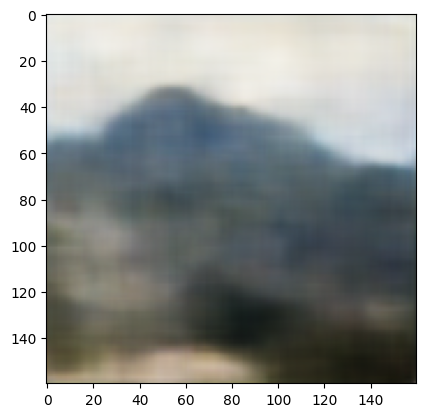

75/75 - 23s - loss: 0.0082 - val_loss: 0.0106 - lr: 6.2500e-05 - 23s/epoch - 309ms/step
Epoch 2/100
1/1 [==============================] - 0s 21ms/step


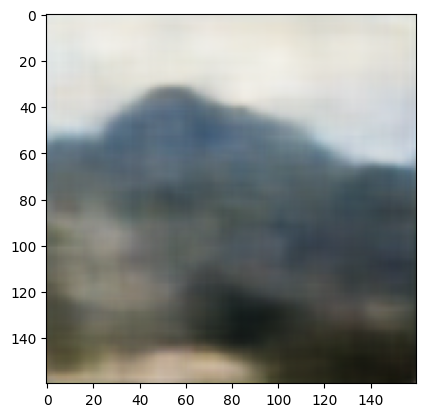

75/75 - 20s - loss: 0.0082 - val_loss: 0.0107 - lr: 6.2500e-05 - 20s/epoch - 263ms/step
Epoch 3/100
1/1 [==============================] - 0s 23ms/step


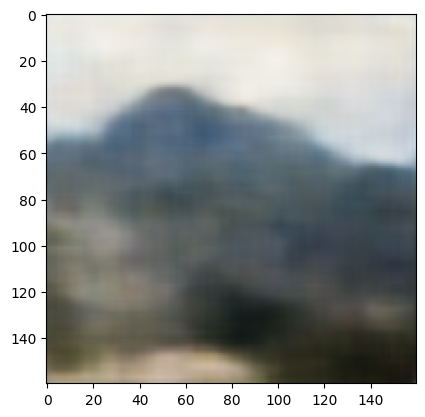

75/75 - 19s - loss: 0.0082 - val_loss: 0.0107 - lr: 6.2500e-05 - 19s/epoch - 253ms/step
Epoch 4/100
1/1 [==============================] - 0s 22ms/step


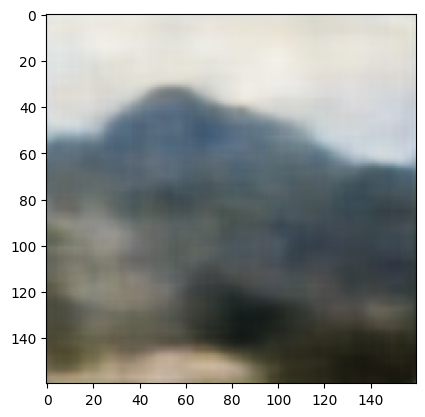

75/75 - 19s - loss: 0.0081 - val_loss: 0.0106 - lr: 6.2500e-05 - 19s/epoch - 254ms/step
Epoch 5/100

Epoch 5: ReduceLROnPlateau reducing learning rate to 3.125000148429535e-05.
1/1 [==============================] - 0s 27ms/step


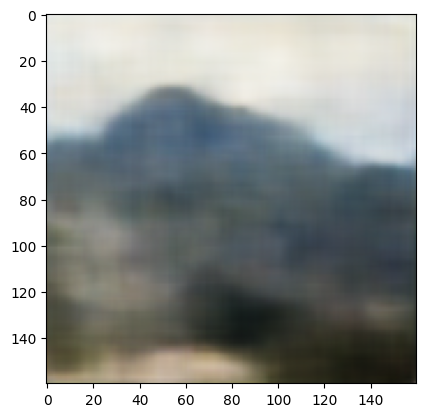

75/75 - 20s - loss: 0.0081 - val_loss: 0.0107 - lr: 6.2500e-05 - 20s/epoch - 265ms/step
Epoch 6/100
1/1 [==============================] - 0s 27ms/step


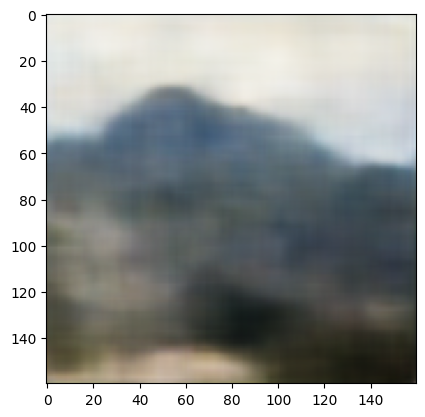

75/75 - 20s - loss: 0.0081 - val_loss: 0.0107 - lr: 3.1250e-05 - 20s/epoch - 266ms/step
Epoch 7/100
1/1 [==============================] - 0s 22ms/step


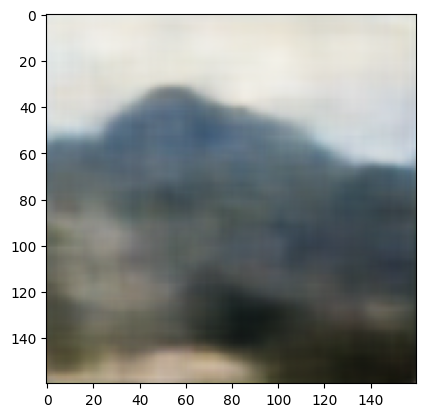

75/75 - 19s - loss: 0.0081 - val_loss: 0.0107 - lr: 3.1250e-05 - 19s/epoch - 259ms/step
Epoch 8/100
1/1 [==============================] - 0s 20ms/step


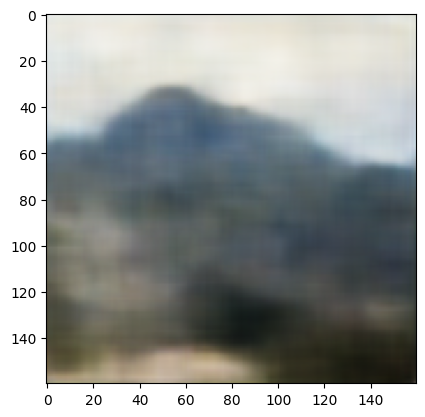

75/75 - 19s - loss: 0.0081 - val_loss: 0.0107 - lr: 3.1250e-05 - 19s/epoch - 258ms/step
Epoch 9/100

Epoch 9: ReduceLROnPlateau reducing learning rate to 1.5625000742147677e-05.
1/1 [==============================] - 0s 22ms/step


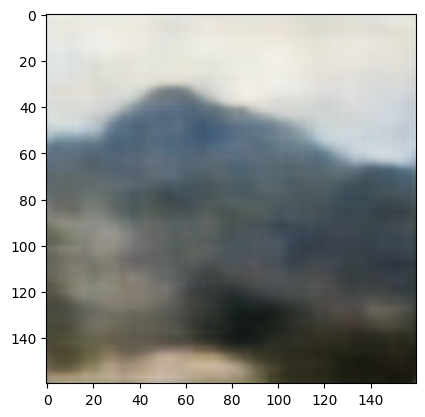

75/75 - 19s - loss: 0.0081 - val_loss: 0.0107 - lr: 3.1250e-05 - 19s/epoch - 259ms/step
Epoch 10/100
1/1 [==============================] - 0s 24ms/step


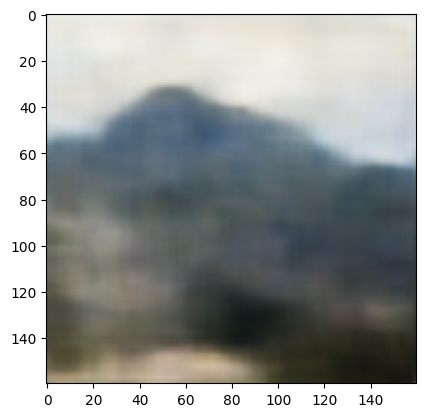

75/75 - 19s - loss: 0.0081 - val_loss: 0.0107 - lr: 1.5625e-05 - 19s/epoch - 259ms/step
Epoch 11/100
1/1 [==============================] - 0s 19ms/step


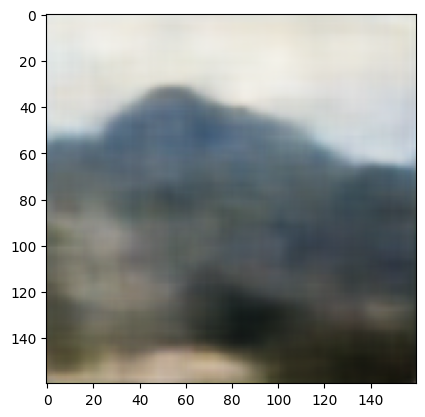

75/75 - 19s - loss: 0.0081 - val_loss: 0.0107 - lr: 1.5625e-05 - 19s/epoch - 258ms/step
Epoch 12/100
1/1 [==============================] - 0s 33ms/step


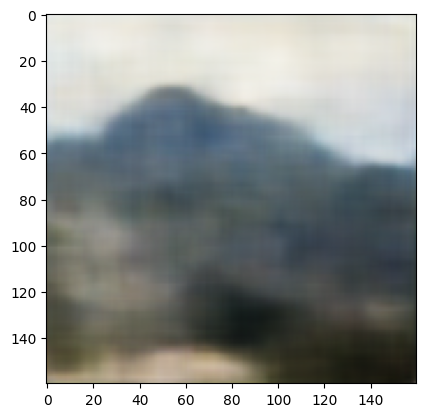

75/75 - 20s - loss: 0.0081 - val_loss: 0.0107 - lr: 1.5625e-05 - 20s/epoch - 263ms/step
Epoch 13/100

Epoch 13: ReduceLROnPlateau reducing learning rate to 1e-05.
1/1 [==============================] - 0s 22ms/step


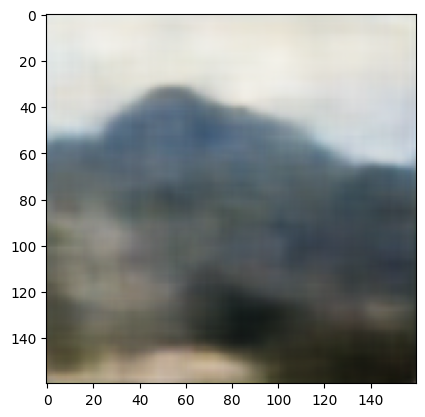

75/75 - 19s - loss: 0.0081 - val_loss: 0.0107 - lr: 1.5625e-05 - 19s/epoch - 259ms/step
Epoch 14/100
1/1 [==============================] - 0s 20ms/step


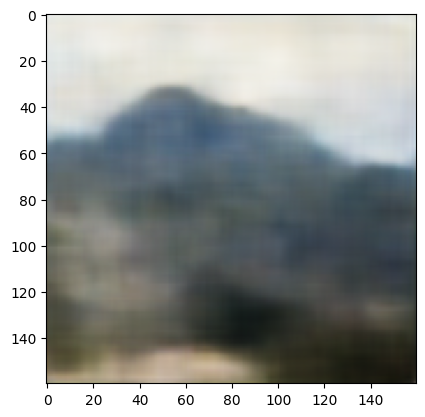

75/75 - 19s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 259ms/step
Epoch 15/100
1/1 [==============================] - 0s 21ms/step


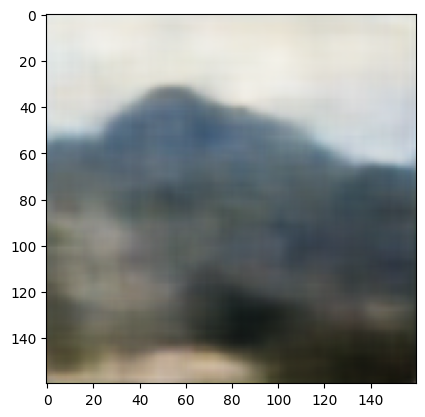

75/75 - 20s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 20s/epoch - 261ms/step
Epoch 16/100
1/1 [==============================] - 0s 22ms/step


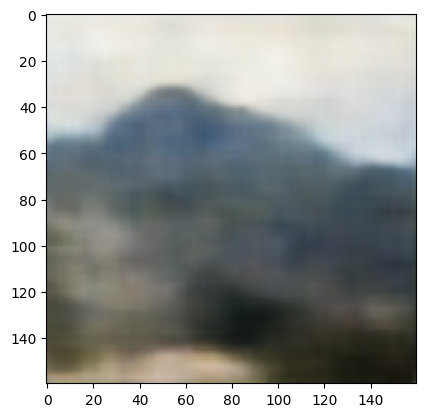

75/75 - 19s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 259ms/step
Epoch 17/100
1/1 [==============================] - 0s 20ms/step


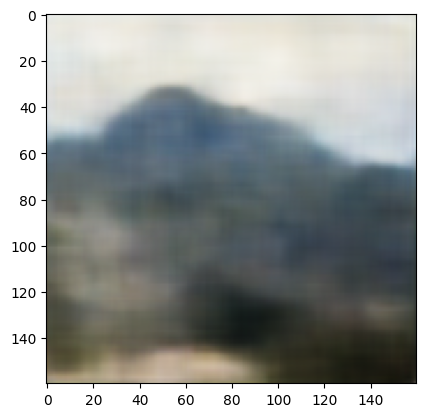

75/75 - 20s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 20s/epoch - 265ms/step
Epoch 18/100
1/1 [==============================] - 0s 25ms/step


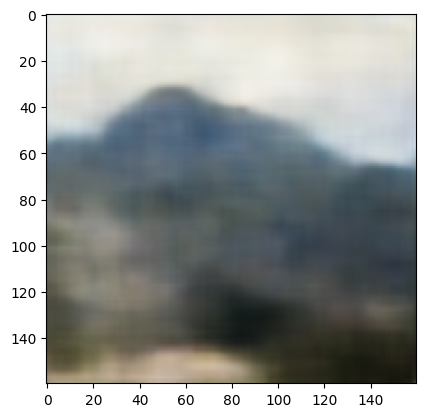

75/75 - 19s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 260ms/step
Epoch 19/100
1/1 [==============================] - 0s 20ms/step


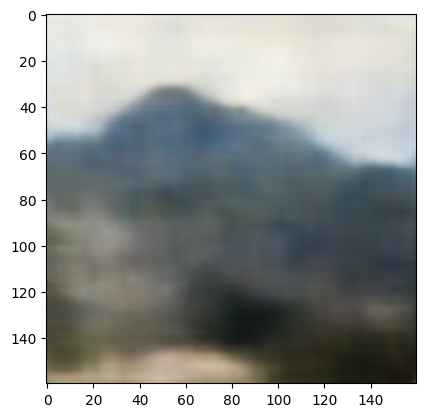

75/75 - 19s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 258ms/step
Epoch 20/100
1/1 [==============================] - 0s 23ms/step


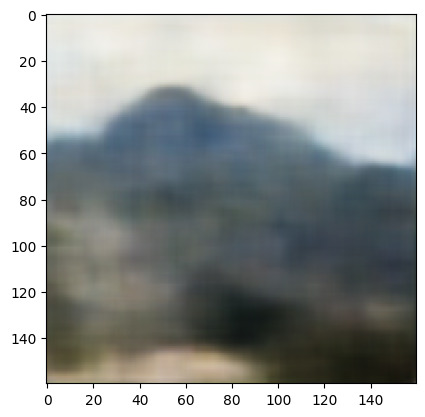

75/75 - 19s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 258ms/step
Epoch 21/100
1/1 [==============================] - 0s 19ms/step


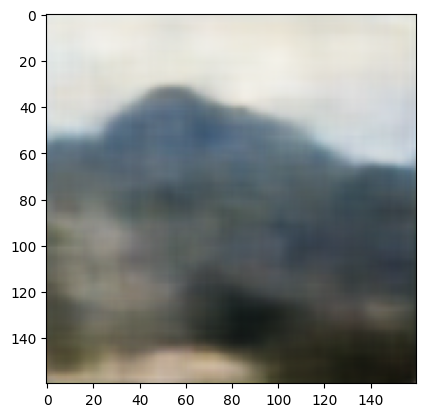

75/75 - 19s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 258ms/step
Epoch 22/100
1/1 [==============================] - 0s 40ms/step


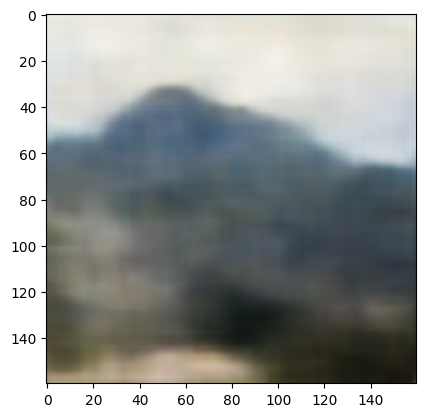

75/75 - 19s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 260ms/step
Epoch 23/100
1/1 [==============================] - 0s 21ms/step


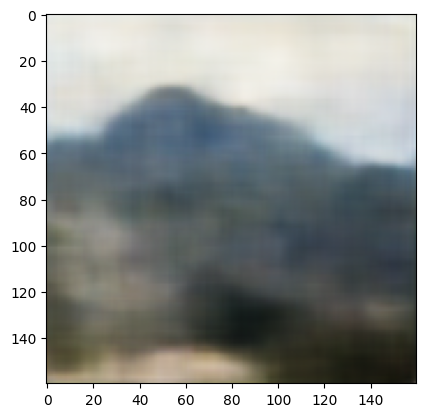

75/75 - 19s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 259ms/step
Epoch 24/100
1/1 [==============================] - 0s 19ms/step


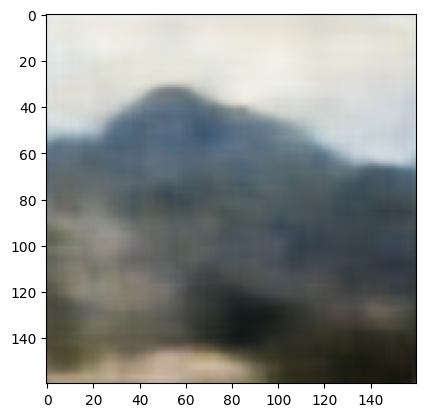

75/75 - 20s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 20s/epoch - 261ms/step
Epoch 25/100
1/1 [==============================] - 0s 22ms/step


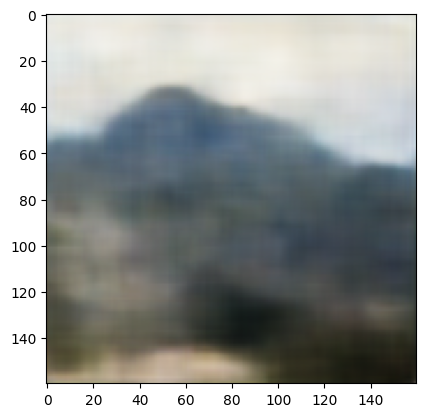

75/75 - 19s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 259ms/step
Epoch 26/100
1/1 [==============================] - 0s 21ms/step


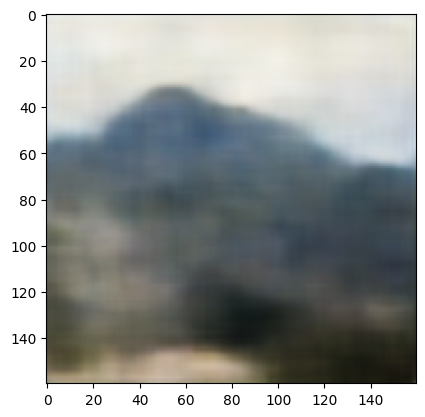

75/75 - 19s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 258ms/step
Epoch 27/100
1/1 [==============================] - 0s 29ms/step


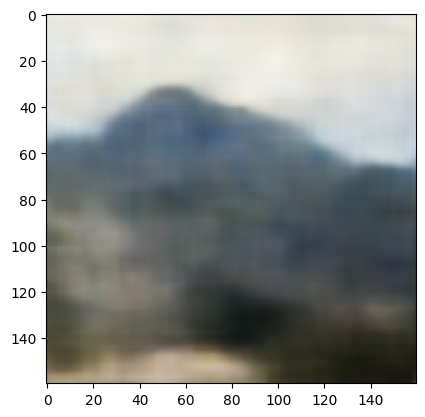

75/75 - 20s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 20s/epoch - 263ms/step
Epoch 28/100
1/1 [==============================] - 0s 21ms/step


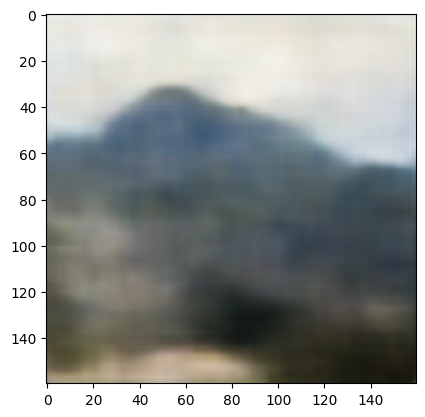

75/75 - 19s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 258ms/step
Epoch 29/100
1/1 [==============================] - 0s 29ms/step


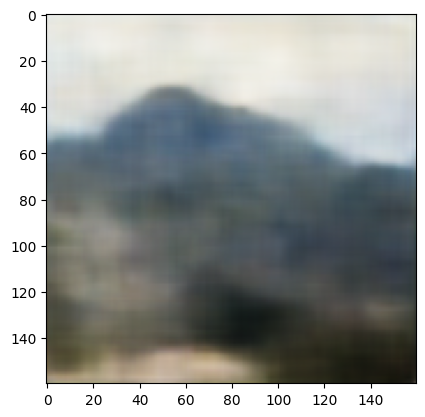

75/75 - 20s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 20s/epoch - 261ms/step
Epoch 30/100
1/1 [==============================] - 0s 19ms/step


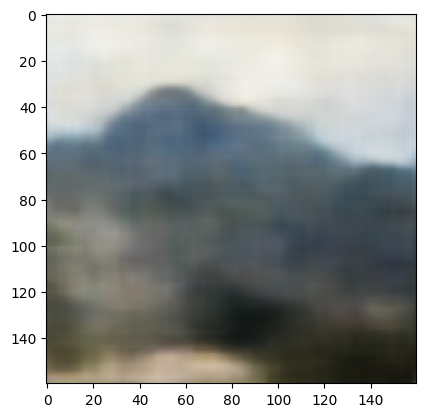

75/75 - 19s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 258ms/step
Epoch 31/100
1/1 [==============================] - 0s 20ms/step


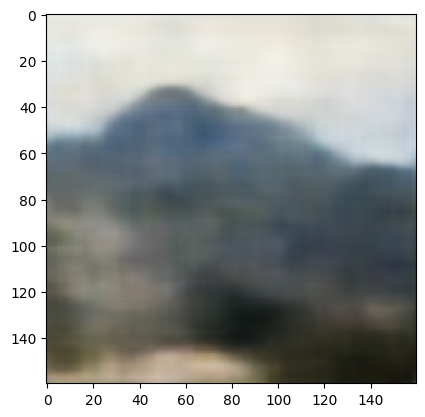

75/75 - 19s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 259ms/step
Epoch 32/100
1/1 [==============================] - 0s 19ms/step


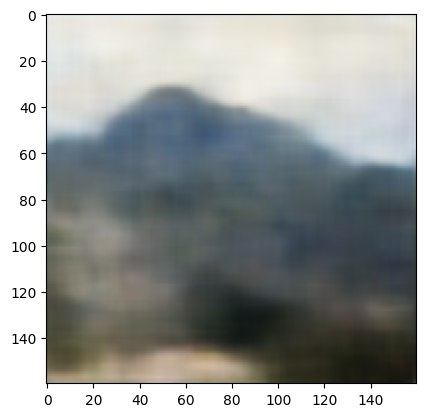

75/75 - 19s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 260ms/step
Epoch 33/100
1/1 [==============================] - 0s 20ms/step


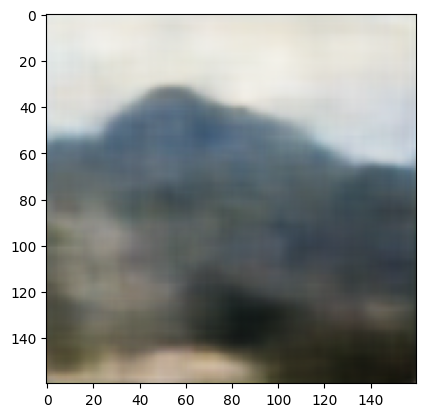

75/75 - 19s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 260ms/step
Epoch 34/100
1/1 [==============================] - 0s 32ms/step


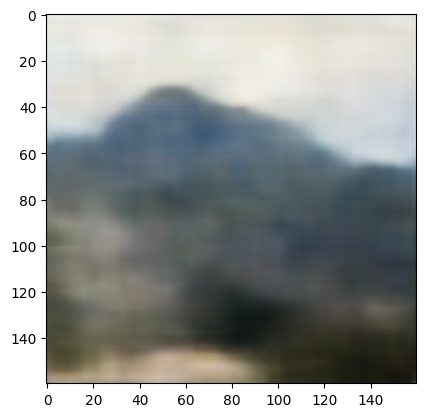

75/75 - 20s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 20s/epoch - 260ms/step
Epoch 35/100
1/1 [==============================] - 0s 22ms/step


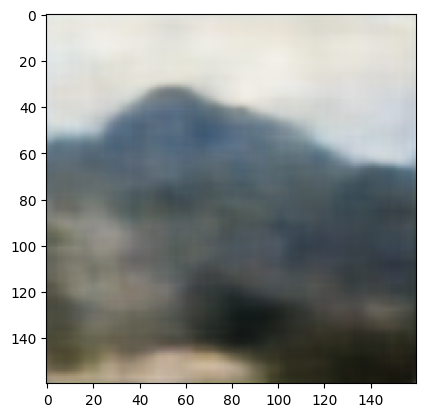

75/75 - 19s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 257ms/step
Epoch 36/100
1/1 [==============================] - 0s 32ms/step


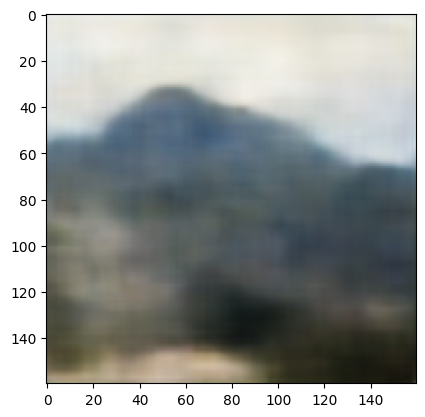

75/75 - 19s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 259ms/step
Epoch 37/100
1/1 [==============================] - 0s 21ms/step


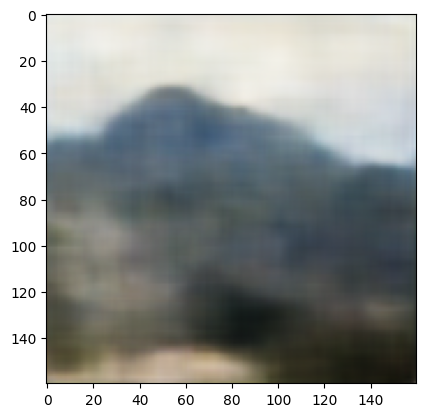

75/75 - 19s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 259ms/step
Epoch 38/100
1/1 [==============================] - 0s 18ms/step


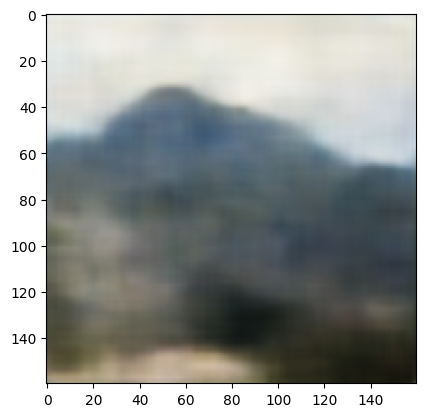

75/75 - 19s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 258ms/step
Epoch 39/100
1/1 [==============================] - 0s 31ms/step


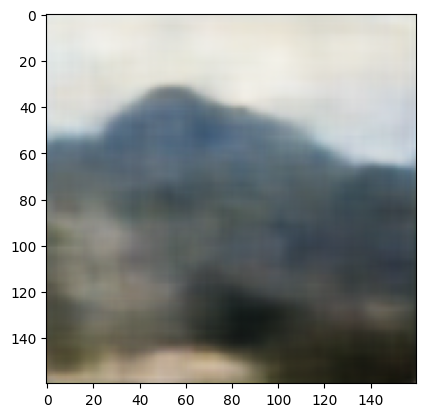

75/75 - 19s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 259ms/step
Epoch 40/100
1/1 [==============================] - 0s 21ms/step


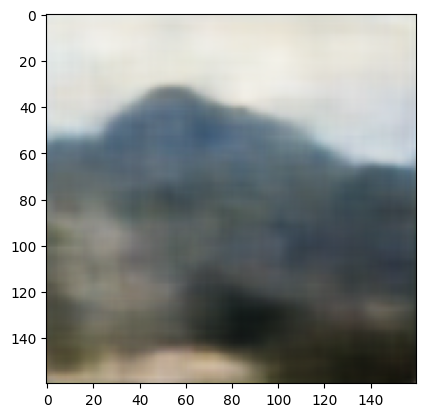

75/75 - 19s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 258ms/step
Epoch 41/100
1/1 [==============================] - 0s 20ms/step


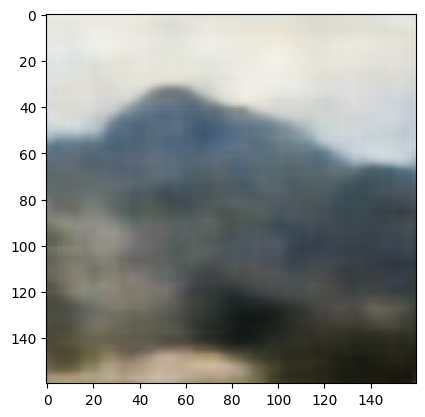

75/75 - 20s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 20s/epoch - 261ms/step
Epoch 42/100
1/1 [==============================] - 0s 24ms/step


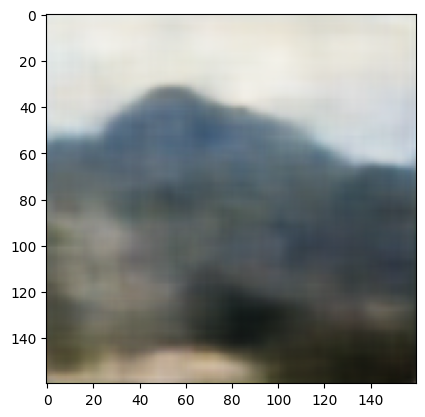

75/75 - 19s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 259ms/step
Epoch 43/100
1/1 [==============================] - 0s 20ms/step


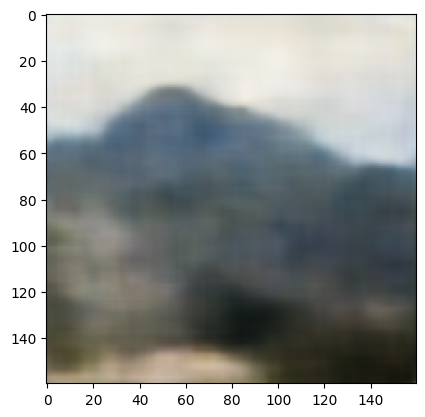

75/75 - 19s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 258ms/step
Epoch 44/100
1/1 [==============================] - 0s 18ms/step


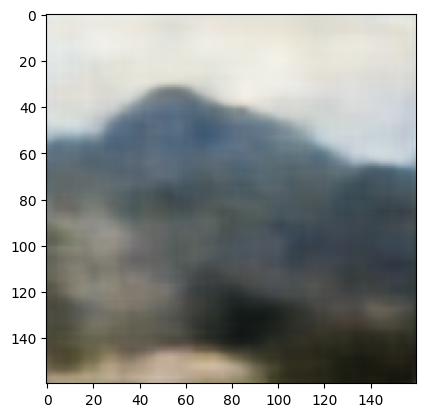

75/75 - 19s - loss: 0.0080 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 258ms/step
Epoch 45/100
1/1 [==============================] - 0s 18ms/step


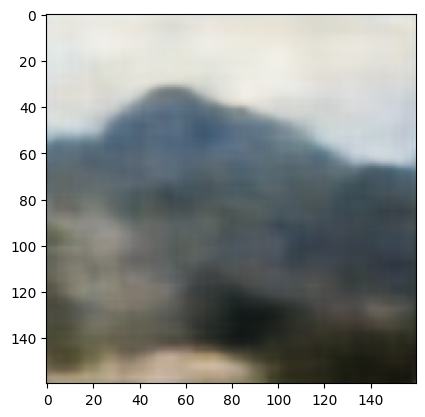

75/75 - 19s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 259ms/step
Epoch 46/100
1/1 [==============================] - 0s 33ms/step


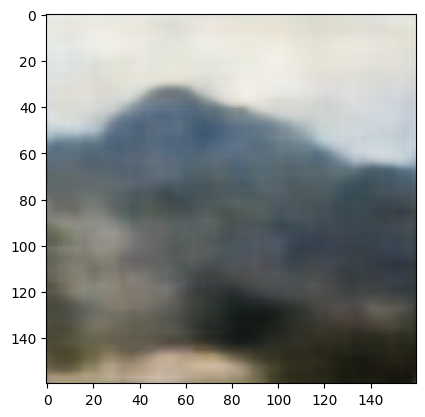

75/75 - 20s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 20s/epoch - 262ms/step
Epoch 47/100
1/1 [==============================] - 0s 29ms/step


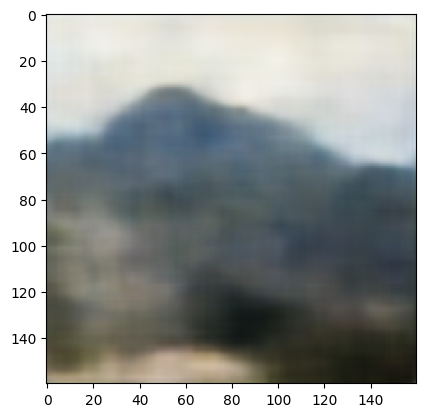

75/75 - 19s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 259ms/step
Epoch 48/100
1/1 [==============================] - 0s 27ms/step


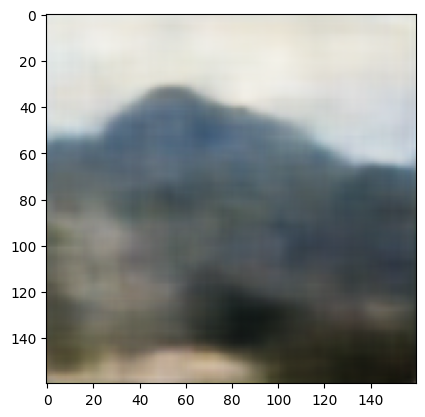

75/75 - 19s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 259ms/step
Epoch 49/100
1/1 [==============================] - 0s 29ms/step


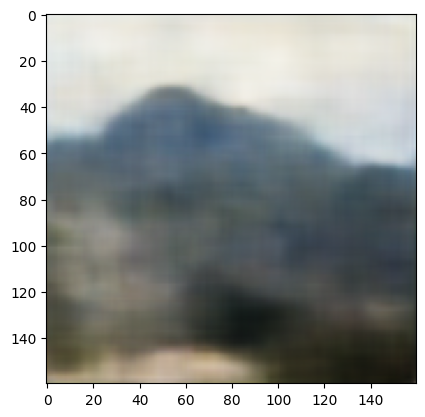

75/75 - 19s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 258ms/step
Epoch 50/100
1/1 [==============================] - 0s 21ms/step


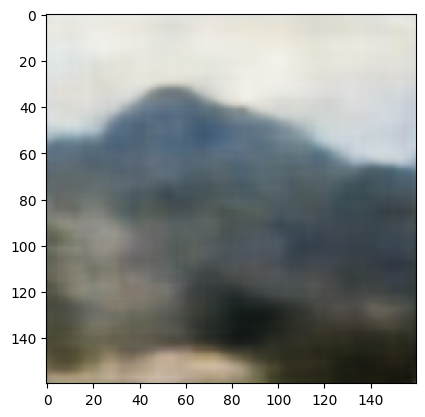

75/75 - 19s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 259ms/step
Epoch 51/100
1/1 [==============================] - 0s 32ms/step


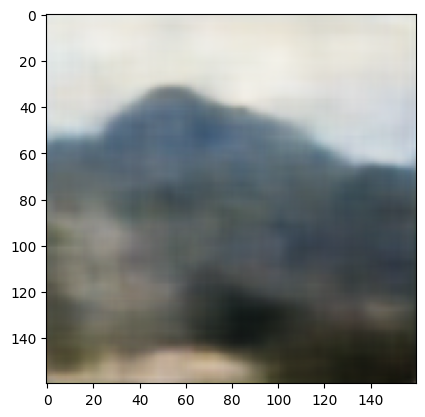

75/75 - 20s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 20s/epoch - 261ms/step
Epoch 52/100
1/1 [==============================] - 0s 18ms/step


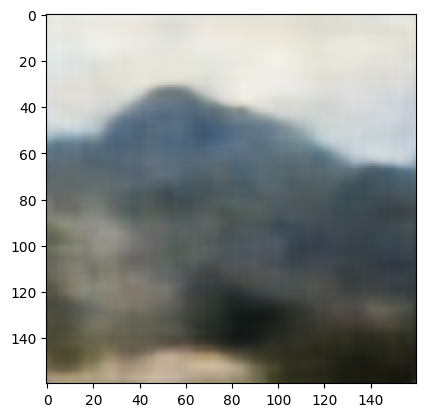

75/75 - 19s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 259ms/step
Epoch 53/100
1/1 [==============================] - 0s 19ms/step


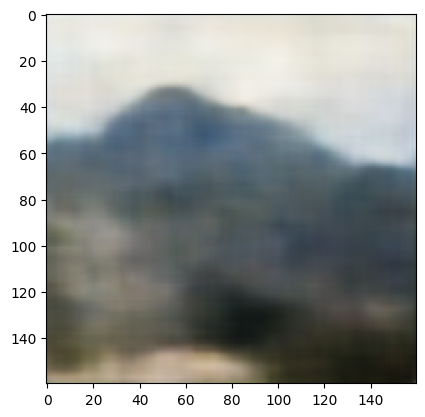

75/75 - 19s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 259ms/step
Epoch 54/100
1/1 [==============================] - 0s 21ms/step


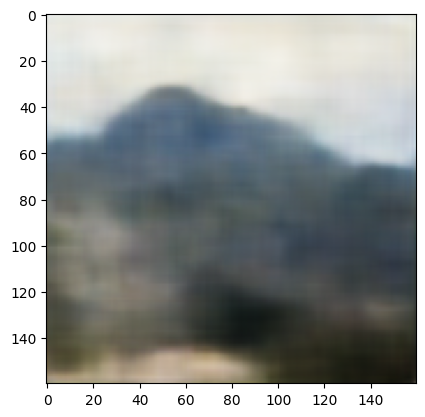

75/75 - 19s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 259ms/step
Epoch 55/100
1/1 [==============================] - 0s 20ms/step


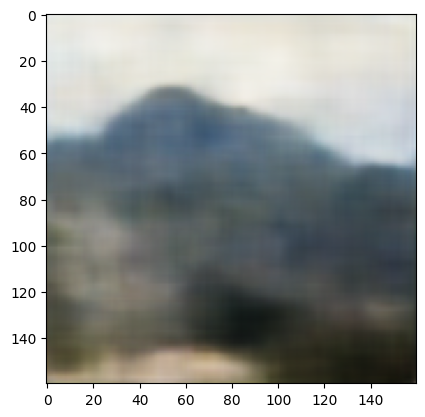

75/75 - 20s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 20s/epoch - 260ms/step
Epoch 56/100
1/1 [==============================] - 0s 20ms/step


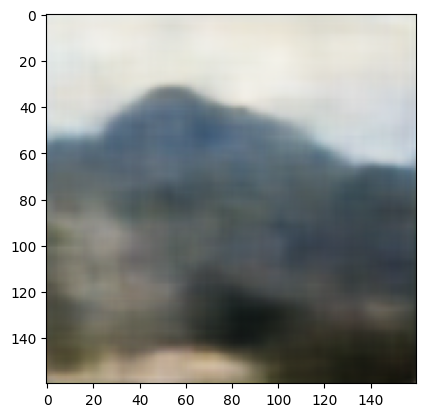

75/75 - 19s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 259ms/step
Epoch 57/100
1/1 [==============================] - 0s 22ms/step


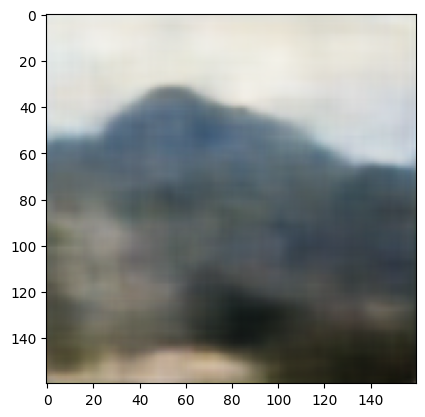

75/75 - 19s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 257ms/step
Epoch 58/100
1/1 [==============================] - 0s 23ms/step


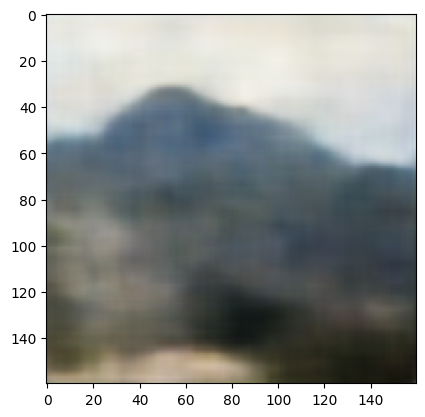

75/75 - 19s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 259ms/step
Epoch 59/100
1/1 [==============================] - 0s 21ms/step


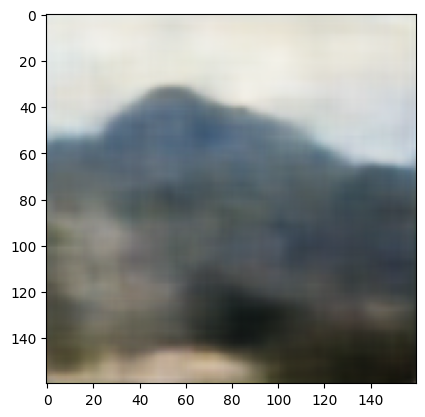

75/75 - 19s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 259ms/step
Epoch 60/100
1/1 [==============================] - 0s 26ms/step


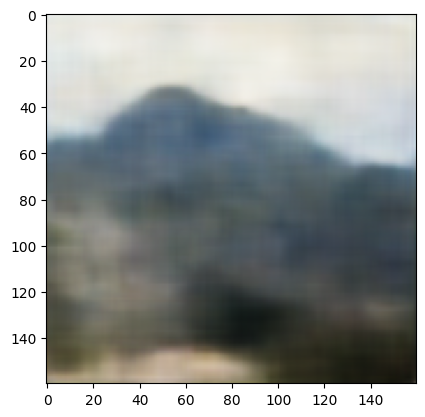

75/75 - 19s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 260ms/step
Epoch 61/100
1/1 [==============================] - 0s 19ms/step


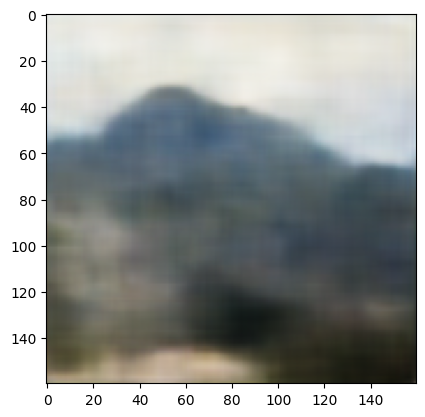

75/75 - 19s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 257ms/step
Epoch 62/100
1/1 [==============================] - 0s 18ms/step


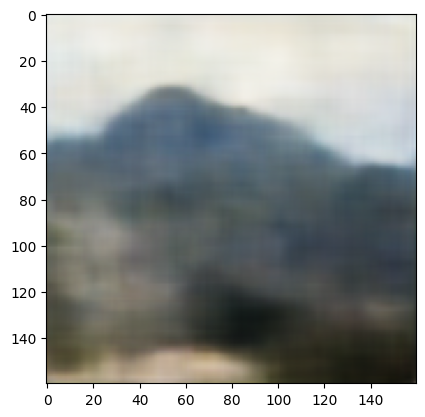

75/75 - 19s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 258ms/step
Epoch 63/100
1/1 [==============================] - 0s 27ms/step


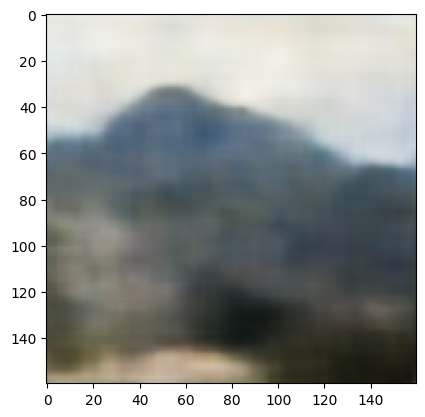

75/75 - 20s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 20s/epoch - 260ms/step
Epoch 64/100
1/1 [==============================] - 0s 19ms/step


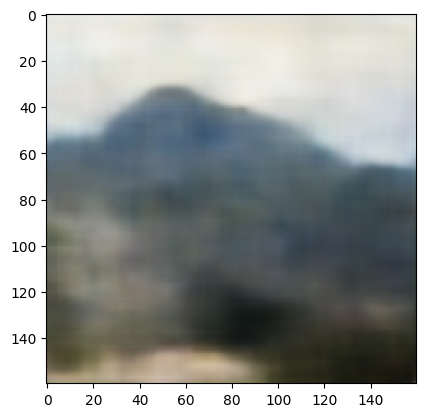

75/75 - 20s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 20s/epoch - 261ms/step
Epoch 65/100
1/1 [==============================] - 0s 18ms/step


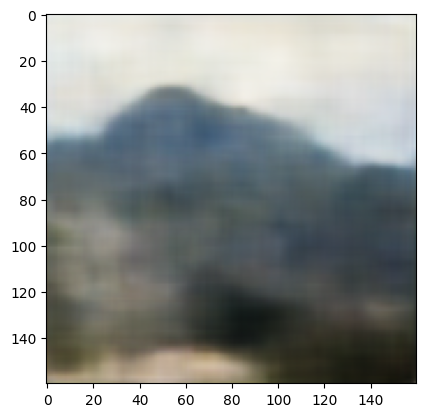

75/75 - 19s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 260ms/step
Epoch 66/100
1/1 [==============================] - 0s 23ms/step


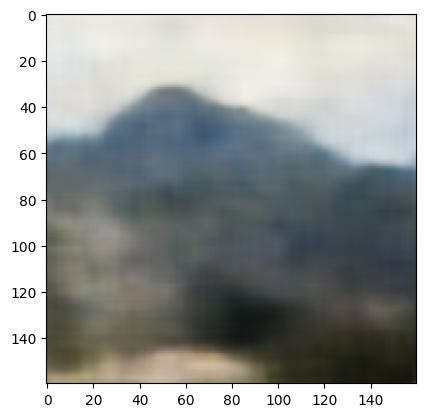

75/75 - 19s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 258ms/step
Epoch 67/100
1/1 [==============================] - 0s 18ms/step


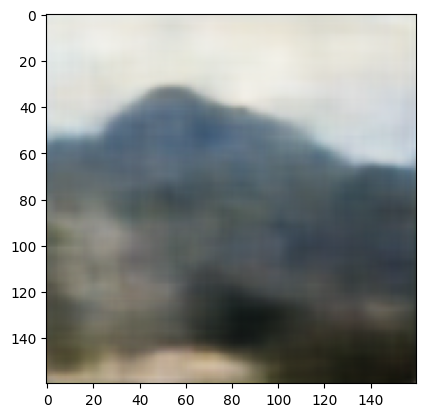

75/75 - 20s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 20s/epoch - 262ms/step
Epoch 68/100
1/1 [==============================] - 0s 19ms/step


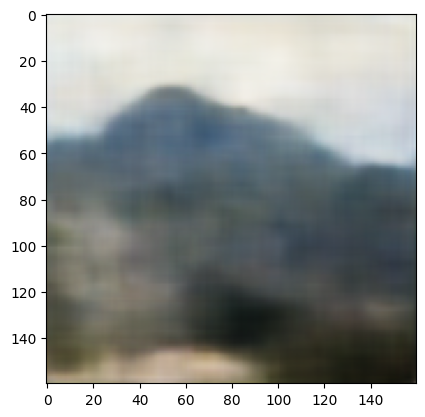

75/75 - 20s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 20s/epoch - 260ms/step
Epoch 69/100
1/1 [==============================] - 0s 18ms/step


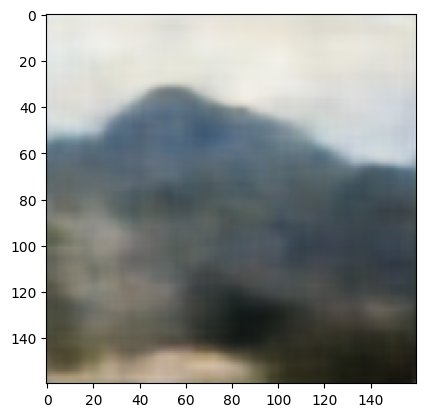

75/75 - 20s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 20s/epoch - 262ms/step
Epoch 70/100
1/1 [==============================] - 0s 31ms/step


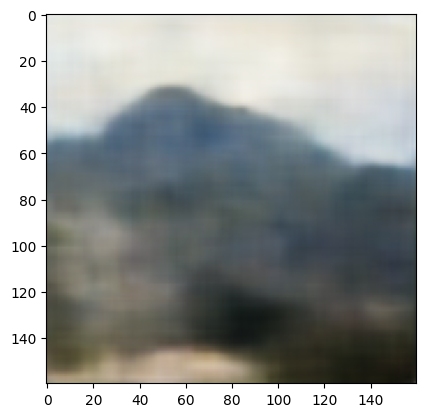

75/75 - 20s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 20s/epoch - 260ms/step
Epoch 71/100
1/1 [==============================] - 0s 21ms/step


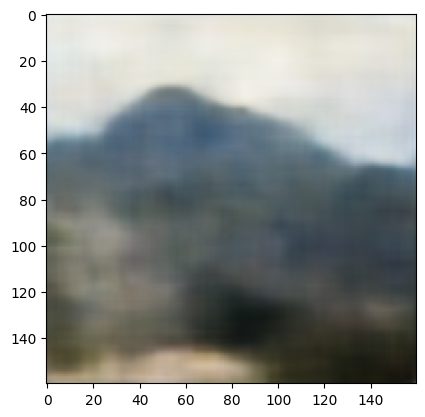

75/75 - 19s - loss: 0.0079 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 259ms/step
Epoch 72/100
1/1 [==============================] - 0s 21ms/step


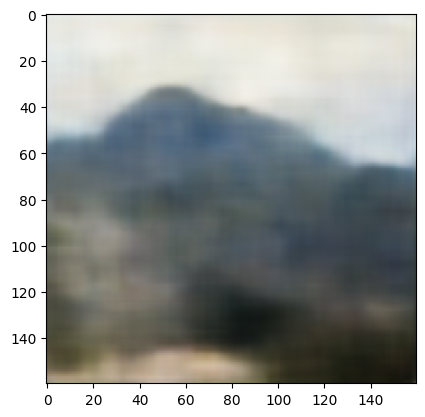

75/75 - 20s - loss: 0.0078 - val_loss: 0.0107 - lr: 1.0000e-05 - 20s/epoch - 261ms/step
Epoch 73/100
1/1 [==============================] - 0s 23ms/step


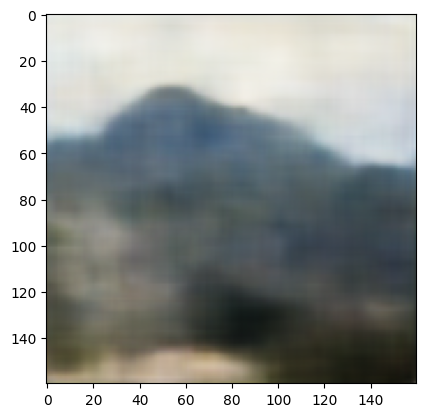

75/75 - 20s - loss: 0.0078 - val_loss: 0.0107 - lr: 1.0000e-05 - 20s/epoch - 260ms/step
Epoch 74/100
1/1 [==============================] - 0s 20ms/step


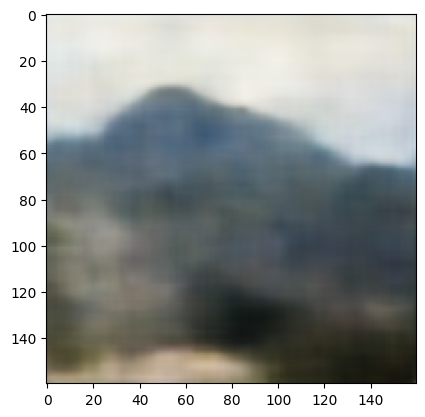

75/75 - 19s - loss: 0.0078 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 259ms/step
Epoch 75/100
1/1 [==============================] - 0s 20ms/step


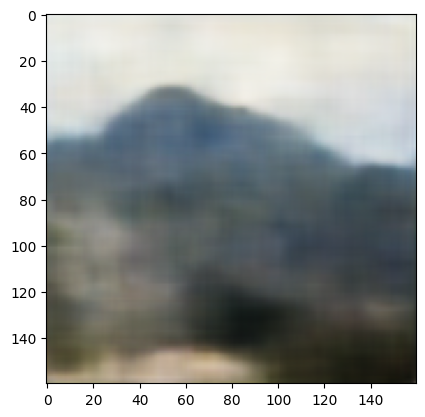

75/75 - 19s - loss: 0.0078 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 258ms/step
Epoch 76/100
1/1 [==============================] - 0s 19ms/step


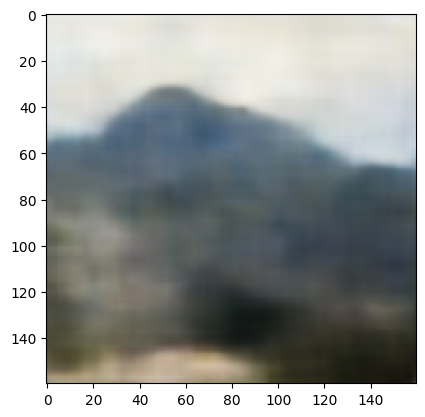

75/75 - 19s - loss: 0.0078 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 259ms/step
Epoch 77/100
1/1 [==============================] - 0s 21ms/step


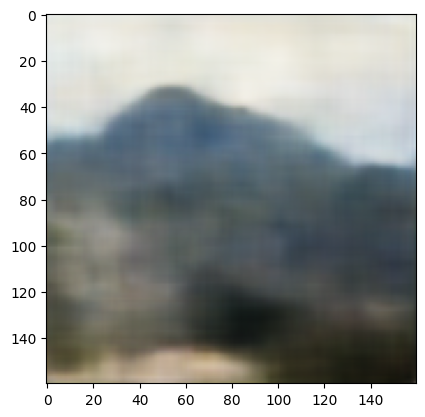

75/75 - 20s - loss: 0.0078 - val_loss: 0.0107 - lr: 1.0000e-05 - 20s/epoch - 260ms/step
Epoch 78/100
1/1 [==============================] - 0s 23ms/step


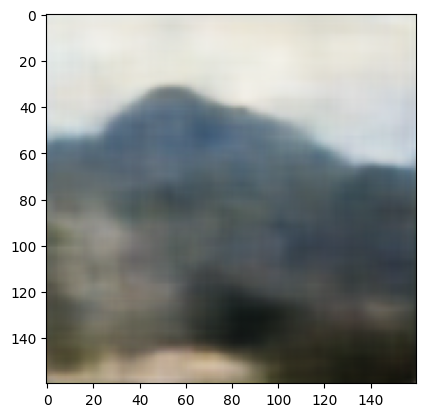

75/75 - 20s - loss: 0.0078 - val_loss: 0.0107 - lr: 1.0000e-05 - 20s/epoch - 260ms/step
Epoch 79/100
1/1 [==============================] - 0s 22ms/step


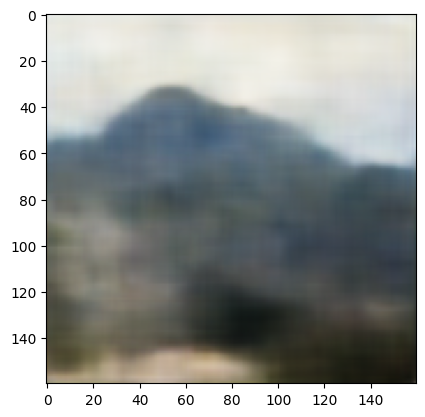

75/75 - 20s - loss: 0.0078 - val_loss: 0.0107 - lr: 1.0000e-05 - 20s/epoch - 260ms/step
Epoch 80/100
1/1 [==============================] - 0s 29ms/step


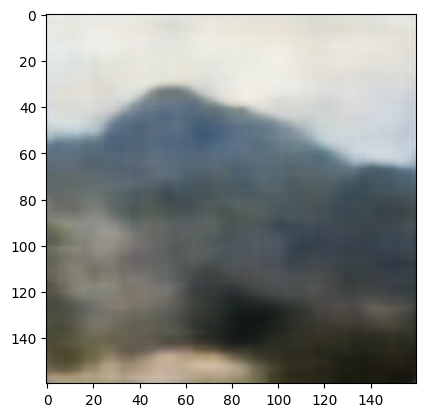

75/75 - 19s - loss: 0.0078 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 259ms/step
Epoch 81/100
1/1 [==============================] - 0s 23ms/step


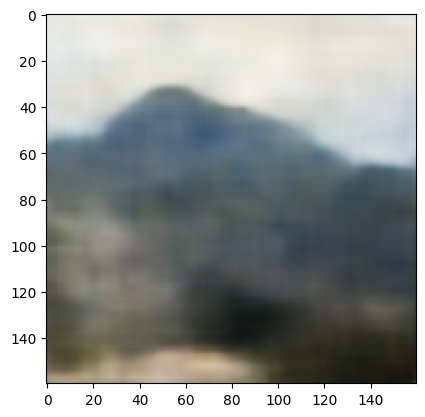

75/75 - 19s - loss: 0.0078 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 258ms/step
Epoch 82/100
1/1 [==============================] - 0s 22ms/step


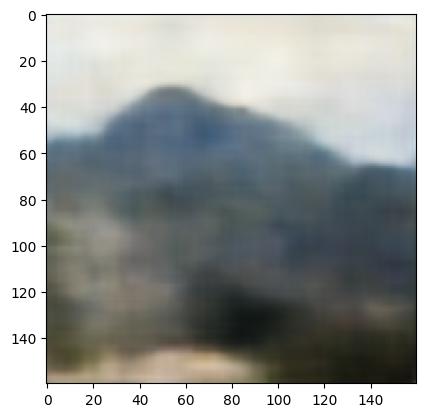

75/75 - 20s - loss: 0.0078 - val_loss: 0.0107 - lr: 1.0000e-05 - 20s/epoch - 261ms/step
Epoch 83/100
1/1 [==============================] - 0s 20ms/step


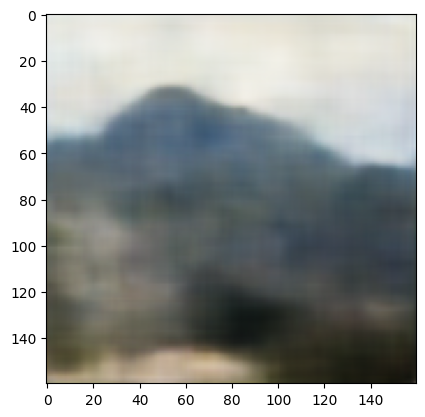

75/75 - 19s - loss: 0.0078 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 260ms/step
Epoch 84/100
1/1 [==============================] - 0s 19ms/step


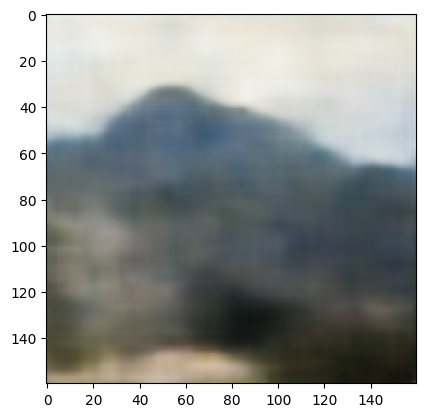

75/75 - 19s - loss: 0.0078 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 257ms/step
Epoch 85/100
1/1 [==============================] - 0s 19ms/step


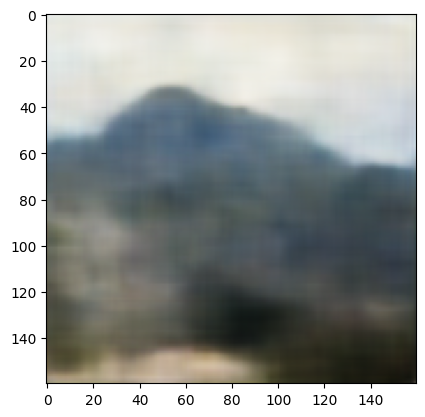

75/75 - 19s - loss: 0.0078 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 258ms/step
Epoch 86/100
1/1 [==============================] - 0s 18ms/step


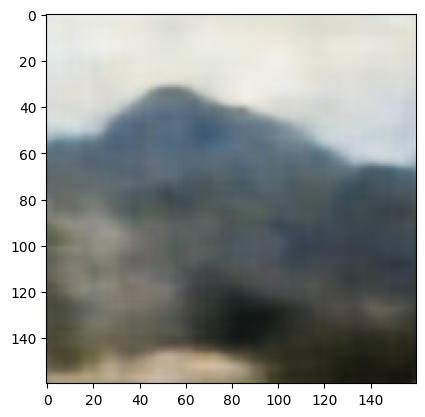

75/75 - 19s - loss: 0.0078 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 259ms/step
Epoch 87/100
1/1 [==============================] - 0s 29ms/step


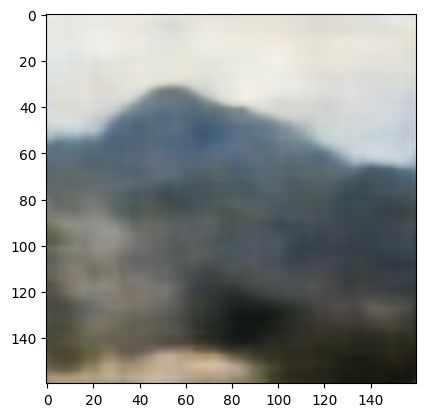

75/75 - 20s - loss: 0.0078 - val_loss: 0.0107 - lr: 1.0000e-05 - 20s/epoch - 261ms/step
Epoch 88/100
1/1 [==============================] - 0s 22ms/step


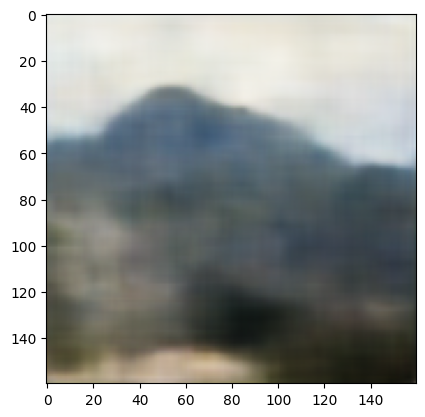

75/75 - 19s - loss: 0.0078 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 260ms/step
Epoch 89/100
1/1 [==============================] - 0s 19ms/step


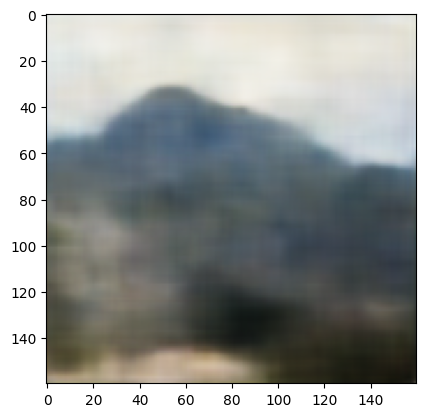

75/75 - 19s - loss: 0.0078 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 258ms/step
Epoch 90/100
1/1 [==============================] - 0s 27ms/step


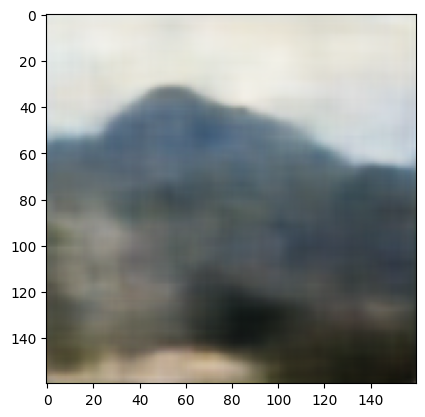

75/75 - 19s - loss: 0.0078 - val_loss: 0.0108 - lr: 1.0000e-05 - 19s/epoch - 258ms/step
Epoch 91/100
1/1 [==============================] - 0s 21ms/step


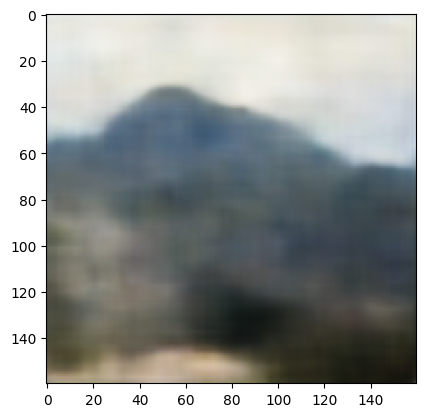

75/75 - 19s - loss: 0.0078 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 258ms/step
Epoch 92/100
1/1 [==============================] - 0s 23ms/step


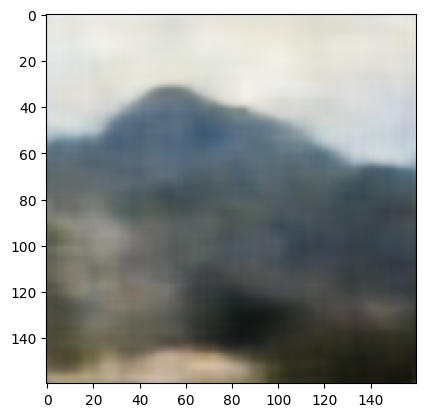

75/75 - 20s - loss: 0.0078 - val_loss: 0.0108 - lr: 1.0000e-05 - 20s/epoch - 261ms/step
Epoch 93/100
1/1 [==============================] - 0s 19ms/step


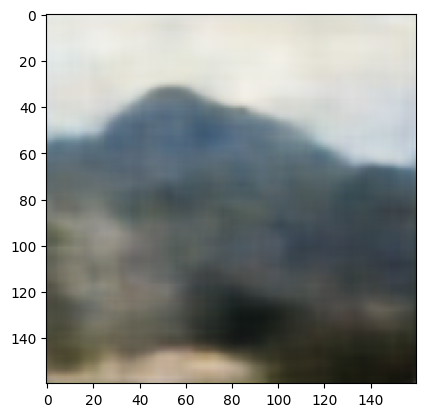

75/75 - 20s - loss: 0.0078 - val_loss: 0.0108 - lr: 1.0000e-05 - 20s/epoch - 260ms/step
Epoch 94/100
1/1 [==============================] - 0s 19ms/step


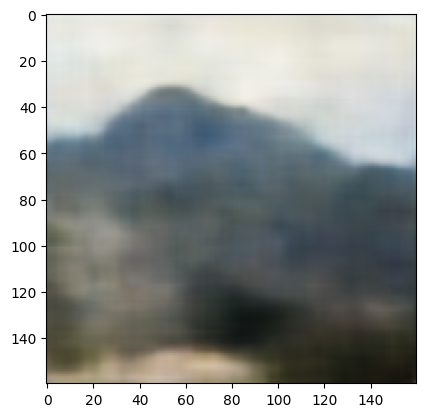

75/75 - 19s - loss: 0.0078 - val_loss: 0.0107 - lr: 1.0000e-05 - 19s/epoch - 257ms/step
Epoch 95/100


In [ ]:
print(xtrain.shape)
model.fit(xtrain, xtrain,
          epochs=100,
          batch_size=32,
          verbose=2,
          validation_split=0.05,
          callbacks=[learning_rate_reduction, checkpoint, early_stopping, imgsample])

79/79 [==============================] - 8s 98ms/step


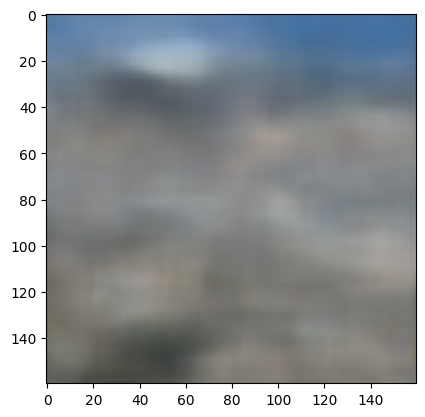

In [17]:
decoded_imgs = model.predict(xtrain)
plt.imshow(decoded_imgs[0])
plt.show()

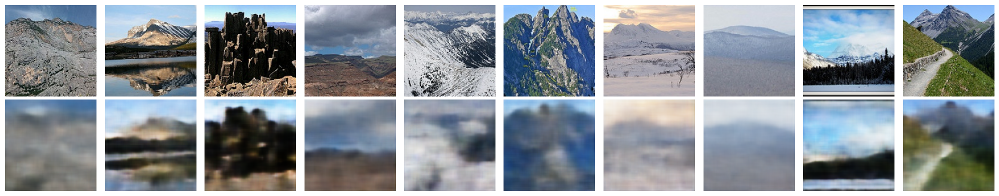

In [18]:
plt.figure(figsize=(20, 4))
for i in range(10):
    # original
    plt.subplot(2, 10, i + 1)
    plt.imshow(xtrain[i])
    plt.axis('off')

    # reconstruction
    plt.subplot(2, 10, i + 1 + 10)
    plt.imshow(decoded_imgs[i])
    plt.axis('off')

plt.tight_layout()
plt.show()